#A Chaotic Cryptosystem for Images Based on Arnold Cat, Henon and Logistic Encryption Cat Map

## By S Rumman F (21BCE1736) and Shashank Kumar (21BCE1887)



<b> What are chaos maps? </b>
<br>
Chaotic systems are a simple sub-type of nonlinear dynamical systems. They may contain very few interacting parts and these may follow very simple rules, but these systems all have a very sensitive dependence on their **initial conditions**. Despite their deterministic simplicity, over time these systems can produce totally unpredictable and wildly divergent (aka, chaotic) behavior.

<br>

**Why Chaos Maps for encryption?**
<br>
Traditional encrypting mechanisms AES and RSA exhibit some drawbacks
and weakness in the encryption of digital images
  and high computing

*   Large computational time for large images
*   High computing power for large images
Consequently, there might be better techniques for image encryption.

A few chaos based algorithms provide a good combination of speed, high security complexity, low computational overheads
Moreover, **certain** chaos-based and other dynamical systems based algorithms have many important properties such as

*   sensitive dependence on initial parameters
*   pseudorandom properties
*   ergodicity
*   non periodicity

#Our Unique Approach

**Selection of Encryption Methods:** The study focuses on three prominent chaos-based encryption methods: Arnold's Cat Map, Henon Map, and Logistic Map. These methods are chosen due to their widespread use and theoretical underpinnings in chaotic systems.

**Image Encryption Process:** Using the selected encryption methods, digital images are encrypted to explore the efficacy of each approach. The encryption process involves applying the transformation algorithms provided by Arnold's Cat Map, Henon Map, and Logistic Map to the pixel values of the images.

##Analysis Techniques:

**Histogram Analysis:** A comprehensive analysis of the histograms of the encrypted images is conducted to evaluate the distribution and intensity characteristics of the encrypted data.

**Adjacent Pixel Automation:** This technique involves examining the correlations and patterns between adjacent pixels in the encrypted images, providing insights into the complexity and randomness of the encryption process.
Key Sensitivity Evaluation: Each encryption method is evaluated against its key sensitivity, which measures the impact of small changes in encryption keys on the encrypted output. This evaluation aims to assess the robustness and security of the encryption methods against key-based attacks.

**Entropy Calculation:** Entropy, a measure of unpredictability and randomness, is calculated for the encrypted images generated by each encryption method. Higher entropy values indicate greater complexity and security in the encryption process.

**Comparison and Suitability Determination:** Through rigorous analysis and comparison of key sensitivity and entropy values, the study aims to determine the most suitable encryption method for securing digital images effectively. This assessment considers factors such as security strength, computational efficiency, and resistance to attacks.

**Validation:** The findings and conclusions derived from the methodology are validated through statistical analysis and experimentation, ensuring the reliability and validity of the research outcomes.

## Entropy
Entropy is a measure of the amount of uncertainty or randomness in the pixel values of an image. It indicates how much information is needed to describe the contents of the image.

Entropy is commonly used in image processing for various purposes such as image analysis, compression, and encryption. It helps in quantifying the complexity of images and can be used as a criterion for evaluating the quality of image processing algorithms. For example, in image compression, entropy is often used to measure the effectiveness of compression techniques in reducing the amount of information required to represent an image.


Entropy plays a crucial role in encryption by quantifying the randomness or unpredictability of data, including images. In encryption, high entropy indicates that the data contains a lot of randomness, making it harder for attackers to decipher the encrypted information.

Function to calculate Entropy

In [1]:
import numpy as np
from PIL import Image

def calculate_entropy(image_path):
    # Open the image
    image = Image.open(image_path)

    # Convert the image to grayscale
    image_gray = image.convert("L")

    # Convert the image to a numpy array
    image_array = np.array(image_gray)

    # Flatten the array to a 1D array
    flat_image_array = image_array.flatten()

    # Calculate the histogram of pixel values
    histogram, _ = np.histogram(flat_image_array, bins=256, range=(0, 256))

    # Normalize the histogram to get the probability distribution
    probability_distribution = histogram / float(np.sum(histogram))

    # Calculate the entropy
    entropy = -np.sum(probability_distribution * np.log2(probability_distribution + 1e-10))

    return entropy

In [2]:
from PIL import Image
import numpy as np
import os
from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
import cv2
import random
from math import log
from google.colab.patches import cv2_imshow
from tqdm import tqdm

###Downloading images
Downloading sample images "HorizonZero.png" and "lena.bmp"

In [3]:
# Downloading HorizonZero.png
!wget https://drive.google.com/uc?id=1Djfm4PqE7Su4WqEdZKiGL-8HtrbVBuMm
!mv uc?id=1Djfm4PqE7Su4WqEdZKiGL-8HtrbVBuMm HorizonZero.png

# Downloading lena.bmp
!wget https://drive.google.com/uc?id=19xZhsjs_r0tLwtu_Wl5DB5rG26dhw069
!mv uc?id=19xZhsjs_r0tLwtu_Wl5DB5rG26dhw069 lena.bmp

--2024-03-20 17:05:40--  https://drive.google.com/uc?id=1Djfm4PqE7Su4WqEdZKiGL-8HtrbVBuMm
Resolving drive.google.com (drive.google.com)... 172.217.12.14, 2607:f8b0:4025:815::200e
Connecting to drive.google.com (drive.google.com)|172.217.12.14|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1Djfm4PqE7Su4WqEdZKiGL-8HtrbVBuMm [following]
--2024-03-20 17:05:40--  https://drive.usercontent.google.com/download?id=1Djfm4PqE7Su4WqEdZKiGL-8HtrbVBuMm
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 172.217.12.1, 2607:f8b0:4025:815::2001
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|172.217.12.1|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 111636 (109K) [image/png]
Saving to: ‘uc?id=1Djfm4PqE7Su4WqEdZKiGL-8HtrbVBuMm’

uc?id=1Djfm4PqE7Su4 100%[===================>] 109.02K  --.-KB/s    in 0.05s   

2024-03-20 17:05:40 (2.19 MB/s) - ‘uc

Function to get Image matrix from Pixel Access object

In [4]:
def getImageMatrix(imageName):
    im = Image.open(imageName)
    pix = im.load()
    color = 1
    if type(pix[0,0]) == int:
      color = 0
    image_size = im.size
    image_matrix = []
    for width in range(int(image_size[0])):
        row = []
        for height in range(int(image_size[1])):
                row.append((pix[width,height]))
        image_matrix.append(row)
    return image_matrix, image_size[0], image_size[1], color


In [5]:
def getImageMatrix_gray(imageName):
    im = Image.open(imageName).convert('LA')
    pix = im.load()
    color = 0  # Grayscale image
    image_size = im.size
    image_matrix = []
    for width in range(int(image_size[0])):
        row = []
        for height in range(int(image_size[1])):
            row.append((pix[width, height]))
        image_matrix.append(row)
    return image_matrix, image_size[0], image_size[1], color


# Arnold Cat Map

Arnold's cat map is a chaotic map often used for pixel manipulation. It applies a tranform on the image that essentially shuffles the pixels by stretching anf folding thethe image. When an optimal number of iterations of the transformation is applied on the image, the resulting image becomes incomprehensible and hence encrypted.

For this implementation
The transform applied on the image is:
R([x,y]) = [(x + y) mod n, (x + 2y) mod n]
where n is the dimensions of the image

<br>

When the transformation is repeated enough times, the original image will reappear.
The number of iterations 'n' at which the original image will reappear is given by these rules of thumb:
Here 'd' is the dimension of the square image:

1.   if d =  2.(5^i) for i >=1, n = 3*d
2.   if d = (5^i) for i >=1, n = 2*d
3.   if d = 6.(5^i) for i>=1, n = 2*d
4.   else n <= 12*d / 7

This periodicity forms the crux of the encryption process. Here key is the number of iterations of transformations initially applied to get the encrypted image. n - key is the number of rounds of transformations applied to get the decrypted image.

In [6]:
def ArnoldCatTransform(img, num):
    rows, cols, ch = img.shape
    n = rows
    img_arnold = np.zeros([rows, cols, ch])
    for x in range(0, rows):
        for y in range(0, cols):
            img_arnold[x][y] = img[(x+y)%n][(x+2*y)%n]
    return img_arnold

Arnold Cat Encryption

In [7]:
def ArnoldCatEncryption(imageName, key):
    img = cv2.imread(imageName)
    for i in range (0,key):
        img = ArnoldCatTransform(img, i)
    cv2.imwrite(imageName.split('.')[0] + "_ArnoldcatEnc.png", img)
    return img

Arnold Cat Decryption

In [8]:
def ArnoldCatDecryption(imageName, key):
    img = cv2.imread(imageName)
    rows, cols, ch = img.shape
    dimension = rows
    decrypt_it = dimension
    if (dimension%2==0) and 5**int(round(log(dimension/2,5))) == int(dimension/2):
        decrypt_it = 3*dimension
    elif 5**int(round(log(dimension,5))) == int(dimension):
        decrypt_it = 2*dimension
    elif (dimension%6==0) and  5**int(round(log(dimension/6,5))) == int(dimension/6):
        decrypt_it = 2*dimension
    else:
        decrypt_it = int(12*dimension/7)
    for i in range(key,decrypt_it):
        img = ArnoldCatTransform(img, i)
    cv2.imwrite(imageName.split('_')[0] + "_ArnoldcatDec.png",img)
    return img

In [9]:
image = "HorizonZero"
ext = ".png"
key = 20

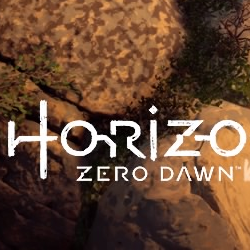

In [10]:
img = cv2.imread(image + ext)
cv2_imshow(img)

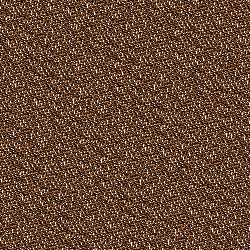

In [11]:
ArnoldCatEncryptionIm = ArnoldCatEncryption(image + ext, key)
cv2_imshow(ArnoldCatEncryptionIm)

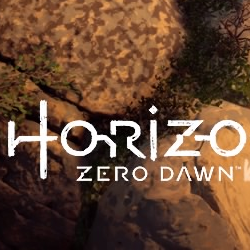

In [12]:
ArnoldCatDecryptionIm = ArnoldCatDecryption(image + "_ArnoldcatEnc.png", key)
cv2_imshow(ArnoldCatDecryptionIm)

## Histogram Analysis


The ciphertext image histogram analysis is one of the most straight-forward methods ofillustrating the image encryption quality. A good image encryption method tends to encrypt a plaintext image to a random incomprehensible form. Thus a good image encyption technique generates a cipher image that has a uniformly distributed intensity histogram.

### Original Image

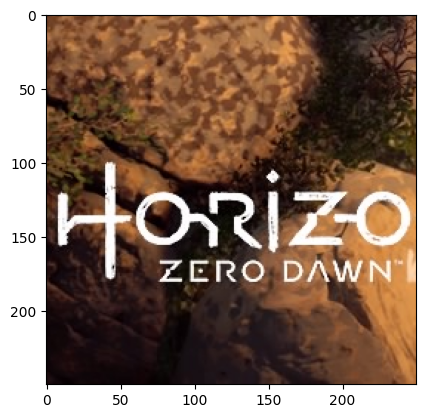

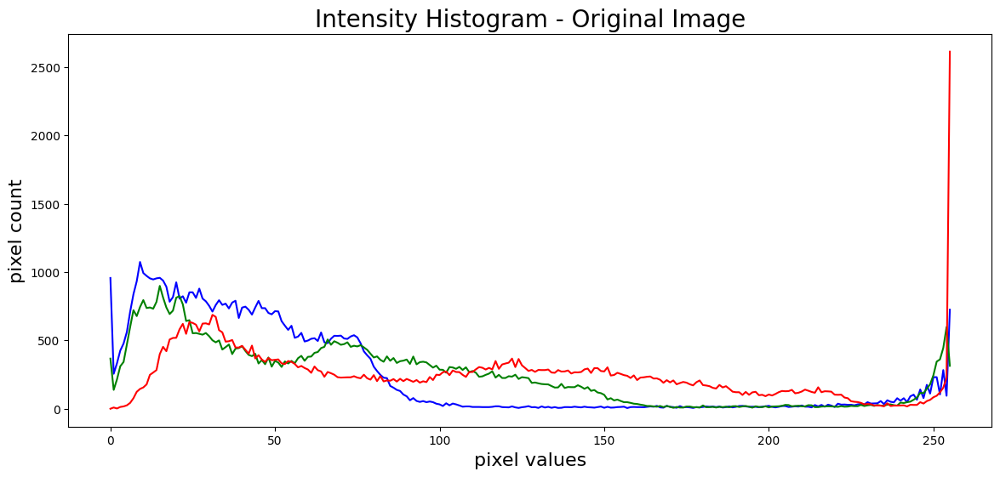

In [13]:
image = "HorizonZero"
ext = ".png"
img = cv2.imread(image + ext,1)
pil_im = Image.open(image + ext, 'r')
imshow(np.asarray(pil_im))

plt.figure(figsize=(14,6))
histogram_blue = cv2.calcHist([img],[0],None,[256],[0,256])
plt.plot(histogram_blue, color='blue')
histogram_green = cv2.calcHist([img],[1],None,[256],[0,256])
plt.plot(histogram_green, color='green')
histogram_red = cv2.calcHist([img],[2],None,[256],[0,256])
plt.plot(histogram_red, color='red')
plt.title('Intensity Histogram - Original Image', fontsize=20)
plt.xlabel('pixel values', fontsize=16)
plt.ylabel('pixel count', fontsize=16)
plt.show()

### Encrypted Image

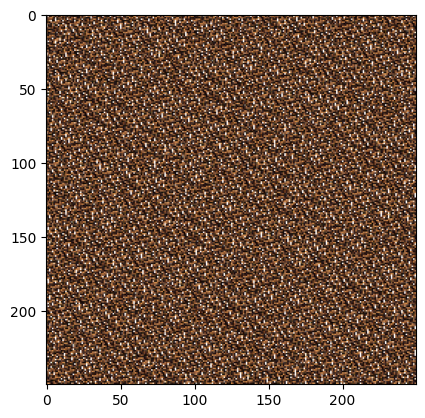

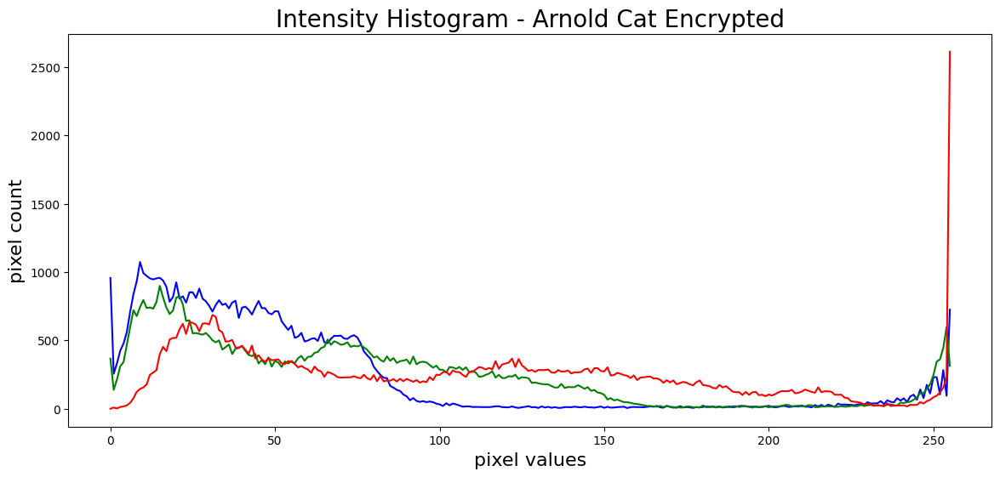

In [14]:
image = "HorizonZero_ArnoldcatEnc"
ext = ".png"
img = cv2.imread(image + ext,1)
pil_im = Image.open(image + ext, 'r')
imshow(np.asarray(pil_im))

plt.figure(figsize=(14,6))
histogram_blue = cv2.calcHist([img],[0],None,[256],[0,256])
plt.plot(histogram_blue, color='blue')
histogram_green = cv2.calcHist([img],[1],None,[256],[0,256])
plt.plot(histogram_green, color='green')
histogram_red = cv2.calcHist([img],[2],None,[256],[0,256])
plt.plot(histogram_red, color='red')
plt.title('Intensity Histogram - Arnold Cat Encrypted', fontsize=20)
plt.xlabel('pixel values', fontsize=16)
plt.ylabel('pixel count', fontsize=16)
plt.show()

## Adjacent Pixel Auto-Correlation
Since images exhibit high information redundancy, it is desirable to have an encryption algorithm that breaks this redundancy. Thus as a metric of encryption performance we find the correlation between adjacent pixels in a direction (Horizontal, Vertical or Diagonal). We have considered the Horizontal direction.

1024 random pixels are picked up from the image and its correlation between it's rightmost neighbour is found and plotted. For a good algorithm, the correlation plot should appear random with no discernable pattern

In [15]:
def getImageMatrix_gray(image):
    img = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
    return img, img.shape[1], img.shape[0], 'gray'

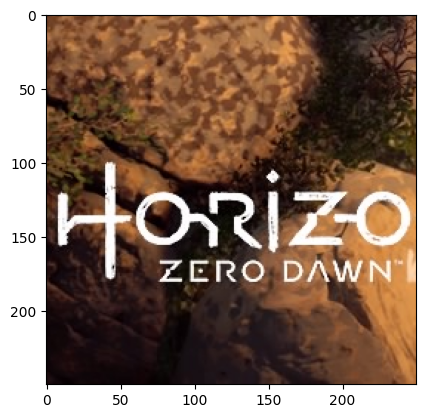

In [16]:
image = "HorizonZero"
ext = ".png"
img = Image.open(image+ext).convert('LA')
pil_im = Image.open(image + ext, 'r')
imshow(np.asarray(pil_im))

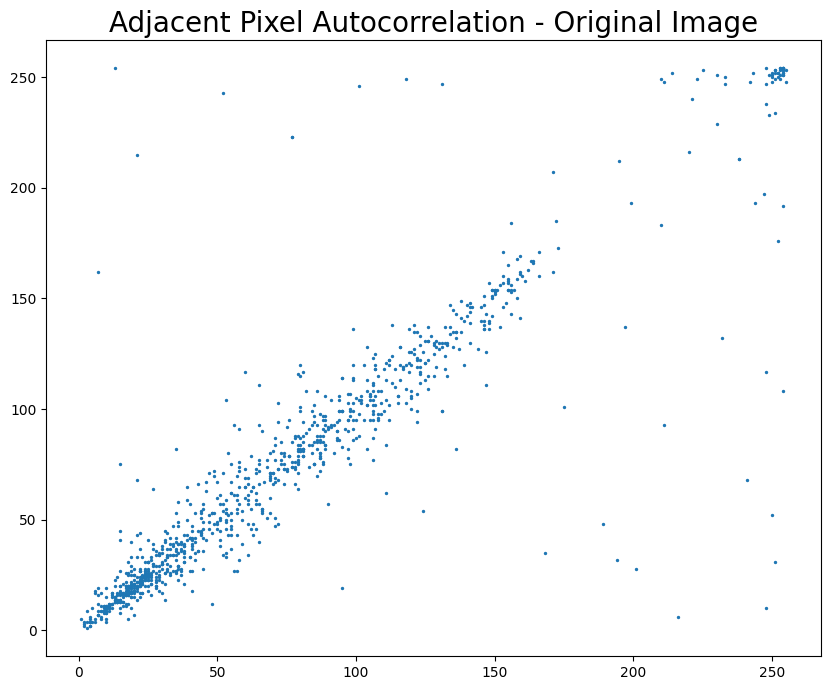

In [17]:
image = "HorizonZero"
ext = ".png"
ImageMatrix, image_width, image_height, color = getImageMatrix_gray(image + ext)
samples_x = []
samples_y = []
for i in range(1024):
    x = random.randint(0, image_width - 2)
    y = random.randint(0, image_height - 1)
    samples_x.append(ImageMatrix[y][x])  # Swapped x and y indices
    samples_y.append(ImageMatrix[y][x + 1])  # Swapped x and y indices
plt.figure(figsize=(10, 8))
plt.scatter(samples_x, samples_y, s=2)
plt.title('Adjacent Pixel Autocorrelation - Original Image', fontsize=20)
plt.show()


250 250


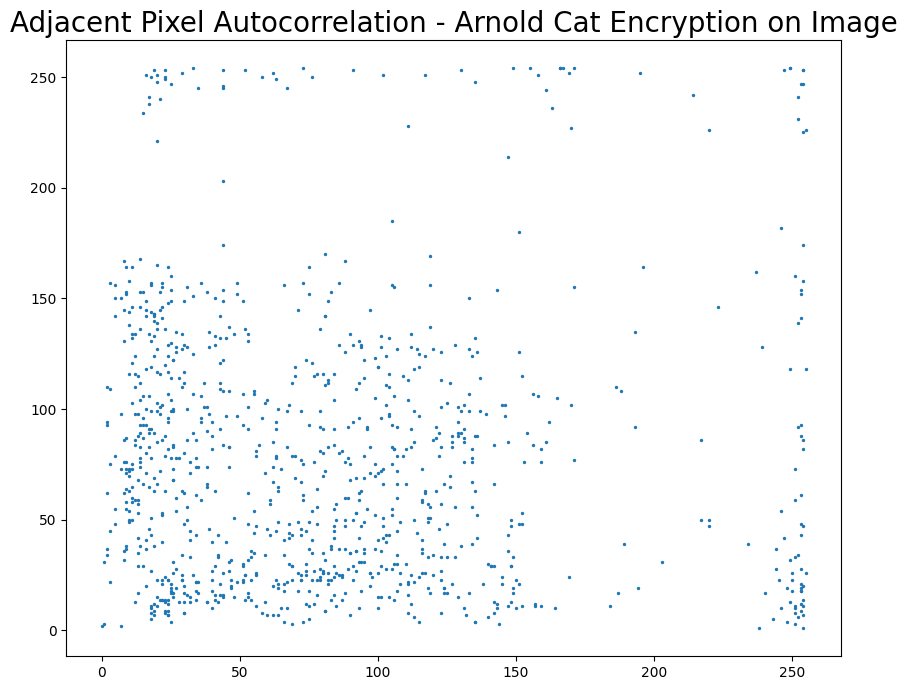

In [18]:
image = "HorizonZero_ArnoldcatEnc"
ext = ".png"
ImageMatrix, image_width, image_height, color = getImageMatrix_gray(image + ext)
samples_x = []
samples_y = []
print(image_width, image_height)  # Print image width and height
for i in range(1024):
    x = random.randint(0, image_width - 2)
    y = random.randint(0, image_height - 1)
    samples_x.append(ImageMatrix[x][y])
    samples_y.append(ImageMatrix[x + 1][y])
plt.figure(figsize=(10, 8))
plt.scatter(samples_x, samples_y, s=2)
plt.title('Adjacent Pixel Autocorrelation - Arnold Cat Encryption on Image', fontsize=20)
plt.show()


## Entropy Analysis


In [19]:
image = "HorizonZero_ArnoldcatEnc"
ext = ".png"
image_path = image + ext

# Calculate the entropy of the image
entropy_ac = calculate_entropy(image_path)
print("Entropy of the image:", entropy_ac)

Entropy of the image: 7.444325188548266


# Henon Map


Given initial conditions (x0,y0), a henon map is given by the following equations:
<br>

(Xn+1) = (Yn) + 1 − a.(Xn)

(Yn+1) = b * (Xn)

Classical Henon map have values of a = 1.4 and b = 0.3. For the classical values the Henon map is chaotic. For other values of a and b the map may be chaotic, intermittent, or converge to a periodic orbit.

In [20]:
def dec(bitSequence):
    decimal = 0
    for bit in bitSequence:
        decimal = decimal * 2 + int(bit)
    return decimal

In [21]:
def getImageDimension(image_path):
    im = Image.open(image_path)
    width, height = im.size
    return width, height

In [22]:
def getImageMatrix_gray(image):
    img = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
    return img, img.shape[1], img.shape[0], 'gray'

In [23]:
def genHenonMap(dimension, key):
    x = key[0]
    y = key[1]

    # Assuming dimension is a tuple (width, height)
    width = dimension[0]
    sequenceSize = width * width * 8  # Total Number of bitSequences produced

    bitSequence = []    # Each bitSequence contains 8 bits
    byteArray = []      # Each byteArray contains m (i.e., 512 in this case) bitSequences
    TImageMatrix = []   # Each TImageMatrix contains m*n byteArray (i.e., 512 byteArray in this case)

    for i in range(sequenceSize):
        xN = y + 1 - 1.4 * x**2
        yN = 0.3 * x

        x = xN
        y = yN

        if xN <= 0.4:
            bit = 0
        else:
            bit = 1

        try:
            bitSequence.append(bit)
        except:
            bitSequence = [bit]

        if i % 8 == 7:
            decimal = dec(bitSequence)
            try:
                byteArray.append(decimal)
            except:
                byteArray = [decimal]
            bitSequence = []

        byteArraySize = width * 8
        if i % byteArraySize == byteArraySize - 1:
            try:
                TImageMatrix.append(byteArray)
            except:
                TImageMatrix = [byteArray]
            byteArray = []

    return TImageMatrix

## Henon Encryption


In [24]:
def HenonEncryption(imageName, key, dimension):
    try:
        imageMatrix, dimensionX, dimensionY, color = getImageMatrix(imageName)
    except Exception as e:
        print("Error getting image matrix:", e)
        return

    try:
        transformationMatrix = genHenonMap((dimensionX, dimensionY), key)  # Use dimensions of the image
    except Exception as e:
        print("Error generating Henon map:", e)
        return

    resultantMatrix = []

    for i in range(dimensionX):
        row = []
        for j in range(dimensionY):
            try:
                if color:
                    row.append(tuple([transformationMatrix[i][j] ^ x for x in imageMatrix[i][j]]))
                else:
                    row.append(transformationMatrix[i][j] ^ imageMatrix[i][j])
            except Exception as e:
                print("Error in encryption loop:", e)
                return

        resultantMatrix.append(row)

    try:
        if color:
            im = Image.new("RGB", (dimensionX, dimensionY))
        else:
            im = Image.new("L", (dimensionX, dimensionY)) # L is for Black and white pixels

        pix = im.load()
        for x in range(dimensionX):
            for y in range(dimensionY):
                pix[x, y] = resultantMatrix[x][y]
        im.save(imageName.split('.')[0] + "_HenonEnc.png", "PNG")
        print("Encryption completed successfully!")
    except Exception as e:
        print("Error saving encrypted image:", e)
        return

## Henon Decryption

In [25]:
def HenonDecryption(imageNameEnc, key, dimension):
    try:
        imageMatrix, dimensionX, dimensionY, color = getImageMatrix(imageNameEnc)
    except Exception as e:
        print("Error getting encrypted image matrix:", e)
        return

    try:
        transformationMatrix = genHenonMap((dimensionX, dimensionY), key)  # Use dimensions of the image
    except Exception as e:
        print("Error generating Henon map:", e)
        return

    pil_im = None
    try:
        pil_im = Image.open(imageNameEnc, 'r')
        imshow(np.asarray(pil_im))
    except Exception as e:
        print("Error opening encrypted image:", e)
        return

    henonDecryptedImage = []
    for i in range(dimensionX):
        row = []
        for j in range(dimensionY):
            try:
                if color:
                    row.append(tuple([transformationMatrix[i][j] ^ x for x in imageMatrix[i][j]]))
                else:
                    row.append(transformationMatrix[i][j] ^ imageMatrix[i][j])
            except Exception as e:
                print("Error in decryption loop:", e)
                return
        try:
            henonDecryptedImage.append(row)
        except Exception as e:
            print("Error appending decrypted image row:", e)
            return

    try:
        if color:
            im = Image.new("RGB", (dimensionX, dimensionY))
        else:
            im = Image.new("L", (dimensionX, dimensionY)) # L is for Black and white pixels

        pix = im.load()
        for x in range(dimensionX):
            for y in range(dimensionY):
                pix[x, y] = henonDecryptedImage[x][y]
        im.save(imageNameEnc.split('_')[0] + "_HenonDec.png", "PNG")
        print("Decryption completed successfully!")
    except Exception as e:
        print("Error saving decrypted image:", e)
        return

## Comparision

In [26]:
image = "HorizonZero"
ext = ".png"
key = (0.1,0.1)
image_path = image + ext
dimension = getImageDimension(image_path)

### Original Image

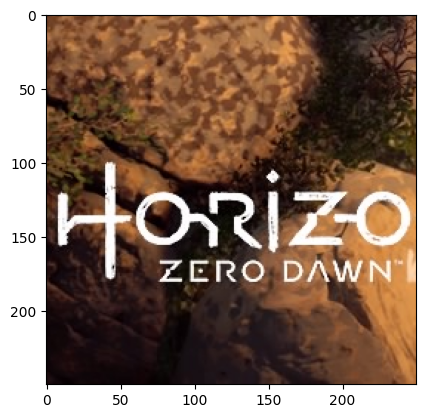

In [27]:
pil_im = Image.open(image + ext, 'r')
imshow(np.asarray(pil_im))

### Encryption

Encryption completed successfully!


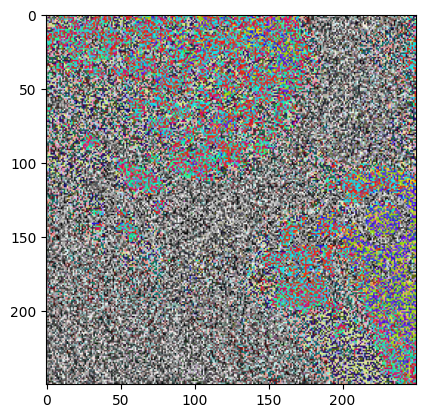

In [28]:
HenonEncryption(image + ext, key, dimension)
im = Image.open(image + "_HenonEnc.png", 'r')
imshow(np.asarray(im))

### Decryption

Decryption completed successfully!


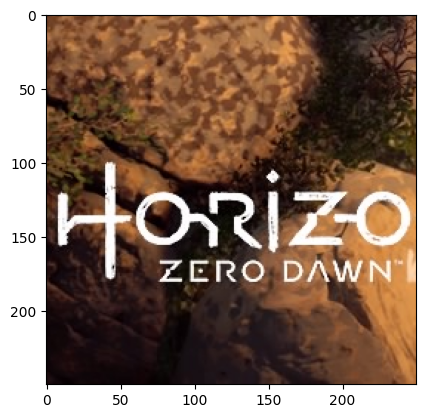

In [29]:
HenonDecryption(image + "_HenonEnc.png", key, dimension)
im = Image.open(image + "_HenonDec.png", 'r')
imshow(np.asarray(im))

In [30]:
image = "lena"
ext = ".bmp"
key = (0.1, 0.1)
image_path = image + ext
dimension = getImageDimension(image_path)

### Original Image

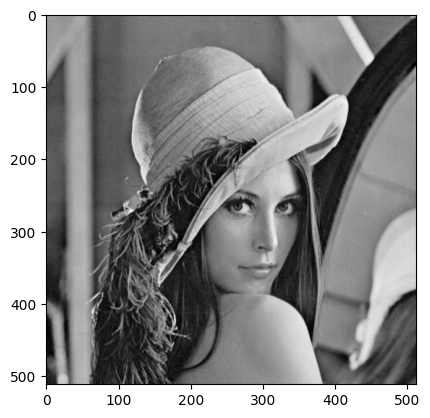

In [31]:
pil_im = Image.open(image + ext, 'r')
imshow(np.asarray(pil_im), cmap='gray')

### Encrypted Image

Encryption completed successfully!


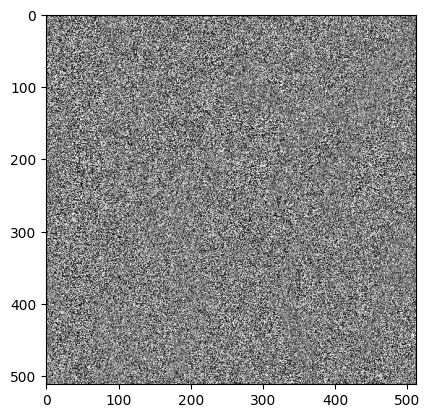

In [32]:
HenonEncryption(image + ext, key, dimension)
im = Image.open(image + "_HenonEnc.png", 'r')
imshow(np.asarray(im), cmap='gray')

### Decrypted Image

Decryption completed successfully!


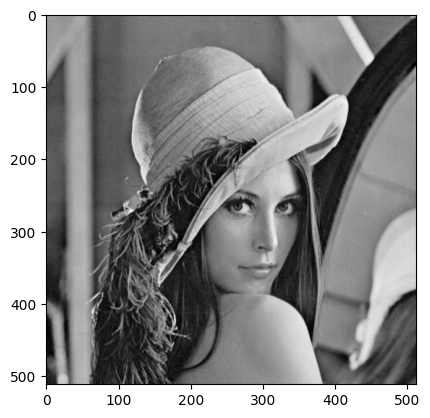

In [33]:
HenonDecryption(image + "_HenonEnc.png", key, dimension)
im = Image.open(image + "_HenonDec.png", 'r')
imshow(np.asarray(im), cmap='gray')

## Histogram


### Original Image

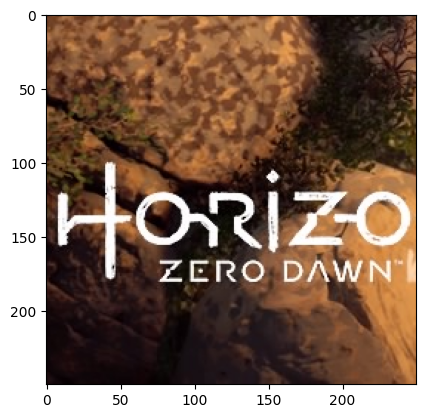

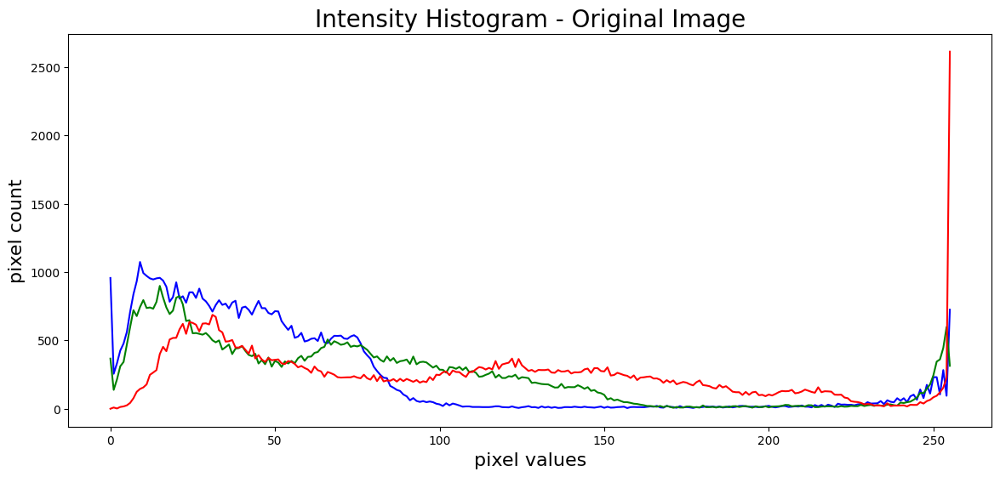

In [34]:
image = "HorizonZero"
ext = ".png"
img = cv2.imread(image + ext,1)
pil_im = Image.open(image + ext, 'r')
imshow(np.asarray(pil_im))
plt.figure(figsize=(14,6))

histogram_blue = cv2.calcHist([img],[0],None,[256],[0,256])
plt.plot(histogram_blue, color='blue')
histogram_green = cv2.calcHist([img],[1],None,[256],[0,256])
plt.plot(histogram_green, color='green')
histogram_red = cv2.calcHist([img],[2],None,[256],[0,256])
plt.plot(histogram_red, color='red')
plt.title('Intensity Histogram - Original Image', fontsize=20)
plt.xlabel('pixel values', fontsize=16)
plt.ylabel('pixel count', fontsize=16)
plt.show()

### Encrypted Image

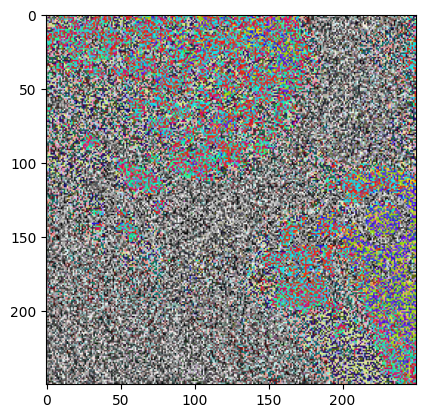

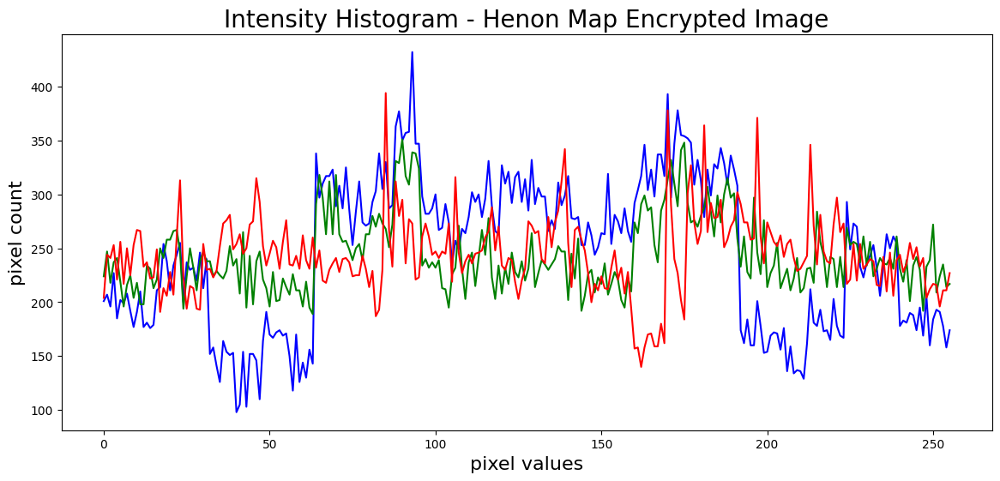

In [35]:
image = "HorizonZero_HenonEnc"
ext = ".png"
img = cv2.imread(image + ext,1)
pil_im = Image.open(image + ext, 'r')
imshow(np.asarray(pil_im))
plt.figure(figsize=(14,6))

histogram_blue = cv2.calcHist([img],[0],None,[256],[0,256])
plt.plot(histogram_blue, color='blue')
histogram_green = cv2.calcHist([img],[1],None,[256],[0,256])
plt.plot(histogram_green, color='green')
histogram_red = cv2.calcHist([img],[2],None,[256],[0,256])
plt.plot(histogram_red, color='red')
plt.title('Intensity Histogram - Henon Map Encrypted Image', fontsize=20)
plt.xlabel('pixel values', fontsize=16)
plt.ylabel('pixel count', fontsize=16)
plt.show()

## Adjacent Pixel AutoCorrelation

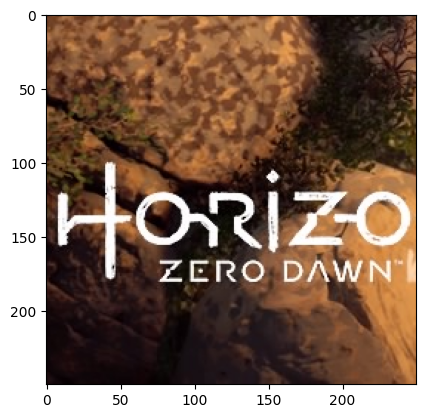

In [36]:
image = "HorizonZero"
ext = ".png"
img = Image.open(image+ext).convert('LA')
pil_im = Image.open(image + ext, 'r')
imshow(np.asarray(pil_im))

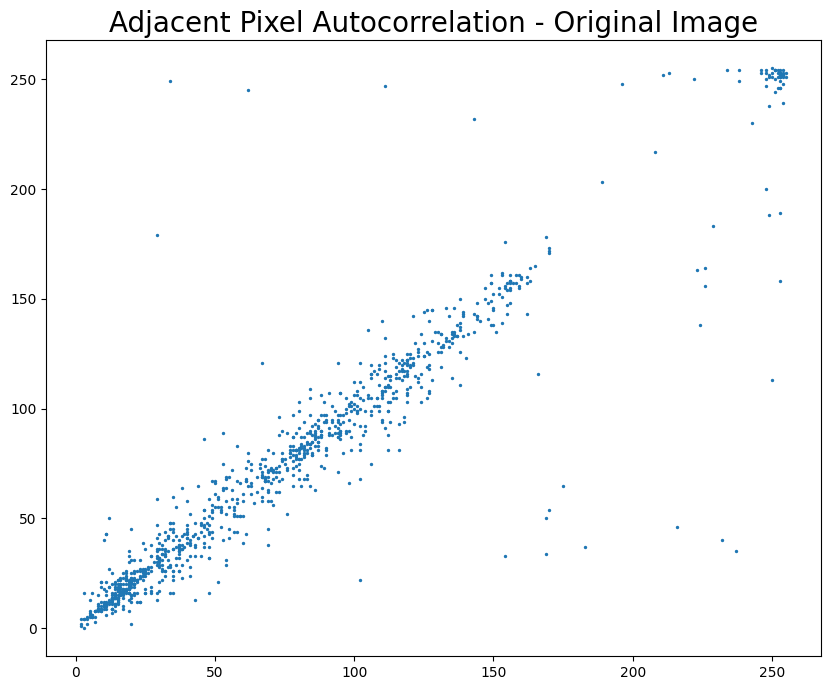

In [37]:
image = "HorizonZero"
ext = ".png"
ImageMatrix, image_width, image_height, color = getImageMatrix_gray(image + ext)
samples_x = []
samples_y = []
for i in range(1024):
    x = random.randint(0, image_width - 2)
    y = random.randint(0, image_height - 1)
    samples_x.append(ImageMatrix[y][x])  # Swapped x and y indices
    samples_y.append(ImageMatrix[y][x + 1])  # Swapped x and y indices
plt.figure(figsize=(10, 8))
plt.scatter(samples_x, samples_y, s=2)
plt.title('Adjacent Pixel Autocorrelation - Original Image', fontsize=20)
plt.show()


250 250


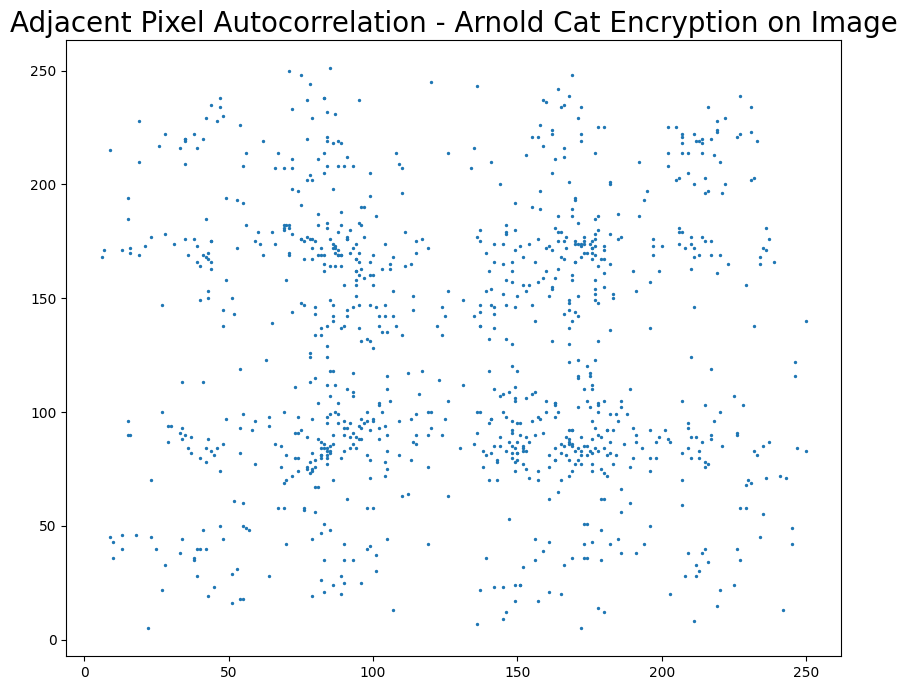

In [38]:
image = "HorizonZero_HenonEnc"
ext = ".png"
ImageMatrix, image_width, image_height, color = getImageMatrix_gray(image + ext)
samples_x = []
samples_y = []
print(image_width, image_height)  # Print image width and height
for i in range(1024):
    x = random.randint(0, image_width - 2)
    y = random.randint(0, image_height - 1)
    samples_x.append(ImageMatrix[x][y])
    samples_y.append(ImageMatrix[x + 1][y])
plt.figure(figsize=(10, 8))
plt.scatter(samples_x, samples_y, s=2)
plt.title('Adjacent Pixel Autocorrelation - Arnold Cat Encryption on Image', fontsize=20)
plt.show()


## Entropy Analysis



In [39]:
image = "HorizonZero_HenonEnc"
ext = ".png"
image_path = image + ext

# Calculate the entropy of the image
entropy_hc = calculate_entropy(image_path)
print("Entropy of the image:", entropy_hc)

Entropy of the image: 7.624939860536196


# Logistic Chaos Maps with key mixing

The logistic map instead uses a nonlinear difference equation to look at discrete time steps. It’s called the logistic map because it maps the population value at any time step to its value at the next time step.

The basic formula is:
(X_t+1) = r.X_t.(1 - X_t)

For this implementation we have included key mixing. The initial values of the chaos map is recalculated after every pixel encryption based on the previous encryption value as well as the key value.

In [40]:
def LogisticEncryption(imageName, key):
    N = 256
    key_list = [ord(x) for x in key]
    G = [key_list[0:4] ,key_list[4:8], key_list[8:12]]
    g = []
    R = 1
    for i in range(1,4):
        s = 0
        for j in range(1,5):
            s += G[i-1][j-1] * (10**(-j))
        g.append(s)
        R = (R*s) % 1

    L = (R + key_list[12]/256) % 1
    S_x = round(((g[0]+g[1]+g[2])*(10**4) + L *(10**4)) % 256)
    V1 = sum(key_list)
    V2 = key_list[0]
    for i in range(1,13):
        V2 = V2 ^ key_list[i]
    V = V2/V1

    L_y = (V+key_list[12]/256) % 1
    S_y = round((V+V2+L_y*10**4) % 256)
    C1_0 = S_x
    C2_0 = S_y
    C = round((L*L_y*10**4) % 256)
    C_r = round((L*L_y*10**4) % 256)
    C_g = round((L*L_y*10**4) % 256)
    C_b = round((L*L_y*10**4) % 256)
    x = 4*(S_x)*(1-S_x)
    y = 4*(S_y)*(1-S_y)

    imageMatrix,dimensionX, dimensionY, color = getImageMatrix(imageName)
    LogisticEncryptionIm = []
    for i in range(dimensionX):
        row = []
        for j in range(dimensionY):
            while x <0.8 and x > 0.2 :
                x = 4*x*(1-x)
            while y <0.8 and y > 0.2 :
                y = 4*y*(1-y)
            x_round = round((x*(10**4))%256)
            y_round = round((y*(10**4))%256)
            C1 = x_round ^ ((key_list[0]+x_round) % N) ^ ((C1_0 + key_list[1])%N)
            C2 = x_round ^ ((key_list[2]+y_round) % N) ^ ((C2_0 + key_list[3])%N)
            if color:
              C_r =((key_list[4]+C1) % N) ^ ((key_list[5]+C2) % N) ^ ((key_list[6]+imageMatrix[i][j][0]) % N) ^ ((C_r + key_list[7]) % N)
              C_g =((key_list[4]+C1) % N) ^ ((key_list[5]+C2) % N) ^ ((key_list[6]+imageMatrix[i][j][1]) % N) ^ ((C_g + key_list[7]) % N)
              C_b =((key_list[4]+C1) % N) ^ ((key_list[5]+C2) % N) ^ ((key_list[6]+imageMatrix[i][j][2]) % N) ^ ((C_b + key_list[7]) % N)
              row.append((C_r,C_g,C_b))
              C = C_r

            else:
              C = ((key_list[4]+C1) % N) ^ ((key_list[5]+C2) % N) ^ ((key_list[6]+imageMatrix[i][j]) % N) ^ ((C + key_list[7]) % N)
              row.append(C)

            x = (x + C/256 + key_list[8]/256 + key_list[9]/256) % 1
            y = (x + C/256 + key_list[8]/256 + key_list[9]/256) % 1
            for ki in range(12):
                key_list[ki] = (key_list[ki] + key_list[12]) % 256
                key_list[12] = key_list[12] ^ key_list[ki]
        LogisticEncryptionIm.append(row)

    im = Image.new("L", (dimensionX, dimensionY))
    if color:
        im = Image.new("RGB", (dimensionX, dimensionY))
    else:
        im = Image.new("L", (dimensionX, dimensionY)) # L is for Black and white pixels

    pix = im.load()
    for x in range(dimensionX):
        for y in range(dimensionY):
            pix[x, y] = LogisticEncryptionIm[x][y]
    im.save(imageName.split('.')[0] + "_LogisticEnc.png", "PNG")

In [41]:
def LogisticDecryption(imageName, key):
    N = 256
    key_list = [ord(x) for x in key]

    G = [key_list[0:4] ,key_list[4:8], key_list[8:12]]
    g = []
    R = 1
    for i in range(1,4):
        s = 0
        for j in range(1,5):
            s += G[i-1][j-1] * (10**(-j))
        g.append(s)
        R = (R*s) % 1

    L_x = (R + key_list[12]/256) % 1
    S_x = round(((g[0]+g[1]+g[2])*(10**4) + L_x *(10**4)) % 256)
    V1 = sum(key_list)
    V2 = key_list[0]
    for i in range(1,13):
        V2 = V2 ^ key_list[i]
    V = V2/V1

    L_y = (V+key_list[12]/256) % 1
    S_y = round((V+V2+L_y*10**4) % 256)
    C1_0 = S_x
    C2_0 = S_y

    C = round((L_x*L_y*10**4) % 256)
    I_prev = C
    I_prev_r = C
    I_prev_g = C
    I_prev_b = C
    I = C
    I_r = C
    I_g = C
    I_b = C
    x_prev = 4*(S_x)*(1-S_x)
    y_prev = 4*(L_x)*(1-S_y)
    x = x_prev
    y = y_prev
    imageMatrix,dimensionX, dimensionY, color = getImageMatrix(imageName)

    henonDecryptedImage = []
    for i in range(dimensionX):
        row = []
        for j in range(dimensionY):
            while x <0.8 and x > 0.2 :
                x = 4*x*(1-x)
            while y <0.8 and y > 0.2 :
                y = 4*y*(1-y)
            x_round = round((x*(10**4))%256)
            y_round = round((y*(10**4))%256)
            C1 = x_round ^ ((key_list[0]+x_round) % N) ^ ((C1_0 + key_list[1])%N)
            C2 = x_round ^ ((key_list[2]+y_round) % N) ^ ((C2_0 + key_list[3])%N)
            if color:
                I_r = ((((key_list[4]+C1) % N) ^ ((key_list[5]+C2) % N) ^ ((I_prev_r + key_list[7]) % N) ^ imageMatrix[i][j][0]) + N-key_list[6])%N
                I_g = ((((key_list[4]+C1) % N) ^ ((key_list[5]+C2) % N) ^ ((I_prev_g + key_list[7]) % N) ^ imageMatrix[i][j][1]) + N-key_list[6])%N
                I_b = ((((key_list[4]+C1) % N) ^ ((key_list[5]+C2) % N) ^ ((I_prev_b + key_list[7]) % N) ^ imageMatrix[i][j][2]) + N-key_list[6])%N
                I_prev_r = imageMatrix[i][j][0]
                I_prev_g = imageMatrix[i][j][1]
                I_prev_b = imageMatrix[i][j][2]
                row.append((I_r,I_g,I_b))
                x = (x +  imageMatrix[i][j][0]/256 + key_list[8]/256 + key_list[9]/256) % 1
                y = (x +  imageMatrix[i][j][0]/256 + key_list[8]/256 + key_list[9]/256) % 1
            else:
                I = ((((key_list[4]+C1) % N) ^ ((key_list[5]+C2) % N) ^ ((I_prev+key_list[7]) % N) ^ imageMatrix[i][j]) + N-key_list[6])%N
                I_prev = imageMatrix[i][j]
                row.append(I)
                x = (x +  imageMatrix[i][j]/256 + key_list[8]/256 + key_list[9]/256) % 1
                y = (x +  imageMatrix[i][j]/256 + key_list[8]/256 + key_list[9]/256) % 1
            for ki in range(12):
                key_list[ki] = (key_list[ki] + key_list[12]) % 256
                key_list[12] = key_list[12] ^ key_list[ki]
        henonDecryptedImage.append(row)
    if color:
        im = Image.new("RGB", (dimensionX, dimensionY))
    else:
        im = Image.new("L", (dimensionX, dimensionY)) # L is for Black and white pixels
    pix = im.load()
    for x in range(dimensionX):
        for y in range(dimensionY):
            pix[x, y] = henonDecryptedImage[x][y]
    im.save(imageName.split('_')[0] + "_LogisticDec.png", "PNG")

### Original Image

In [42]:
image = "lena"
ext = ".bmp"

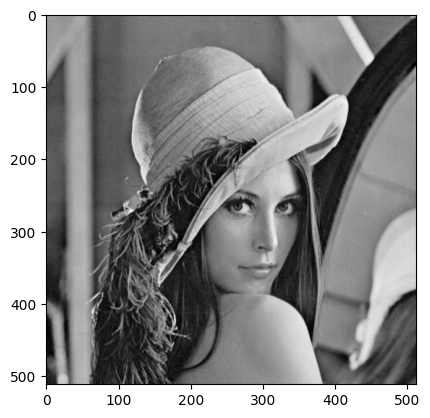

In [43]:
pil_im = Image.open(image + ext, 'r')
imshow(np.asarray(pil_im), cmap='gray')

### Encryption

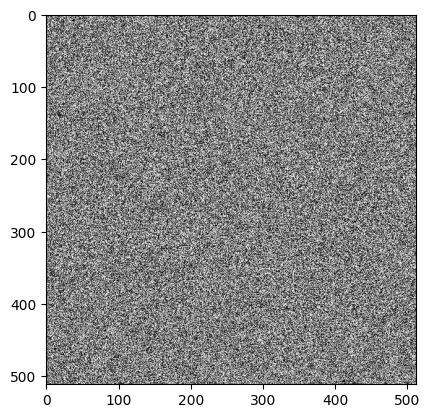

In [44]:
# Note: As it is implemented, the funciton will assume a 13 character long encryption key.
#       One can tweak this limitation by changing the "key_list" structure at the Logistic functions.
LogisticEncryption("lena.bmp", "abcdefghijklm")
im = Image.open("lena_LogisticEnc.png", 'r')
imshow(np.asarray(im), cmap='gray')

### Decryption

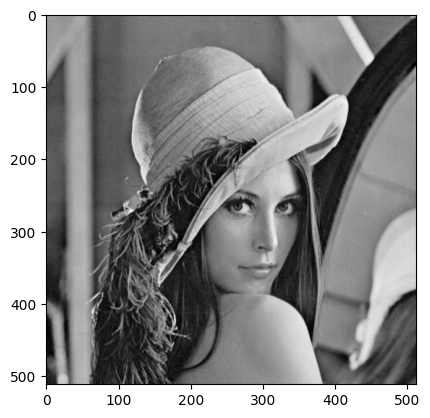

In [45]:
LogisticDecryption("lena_LogisticEnc.png","abcdefghijklm")
im = Image.open("lena_LogisticDec.png", 'r')
imshow(np.asarray(im),cmap='gray')

### Original Image

In [46]:
image = "HorizonZero"
ext = ".png"
key = "abcdefghijklm"

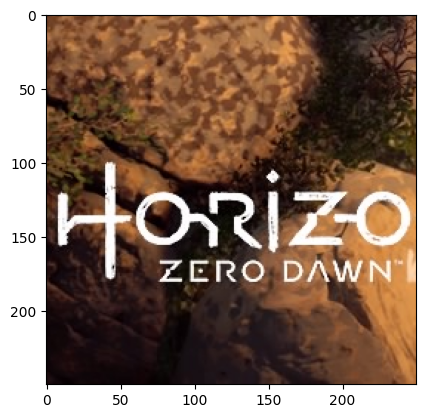

In [47]:
pil_im = Image.open(image + ext, 'r')
imshow(np.asarray(pil_im), cmap='gray')

### Encryption

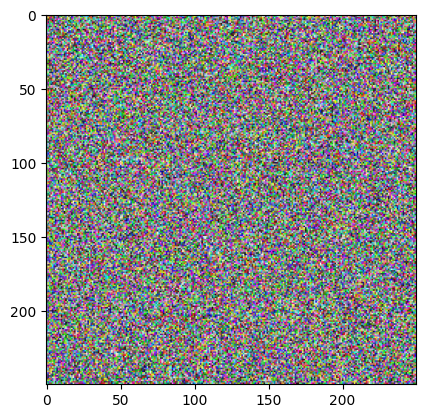

In [48]:
LogisticEncryption(image + ext, key)
im = Image.open(image + "_LogisticEnc.png", 'r')
imshow(np.asarray(im))

### Decryption

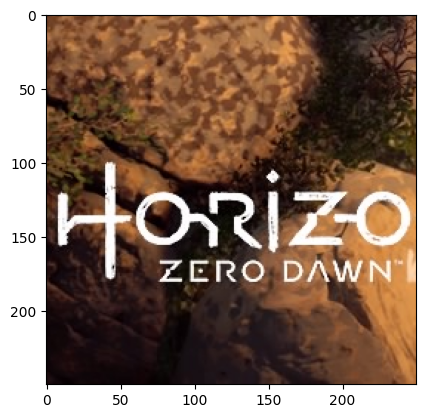

In [49]:
LogisticDecryption(image + "_LogisticEnc.png", key)
im = Image.open(image + "_LogisticDec.png", 'r')
imshow(np.asarray(im))

## Histogram Analysis

### Original Image

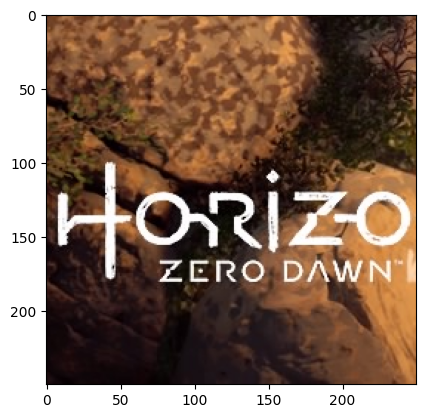

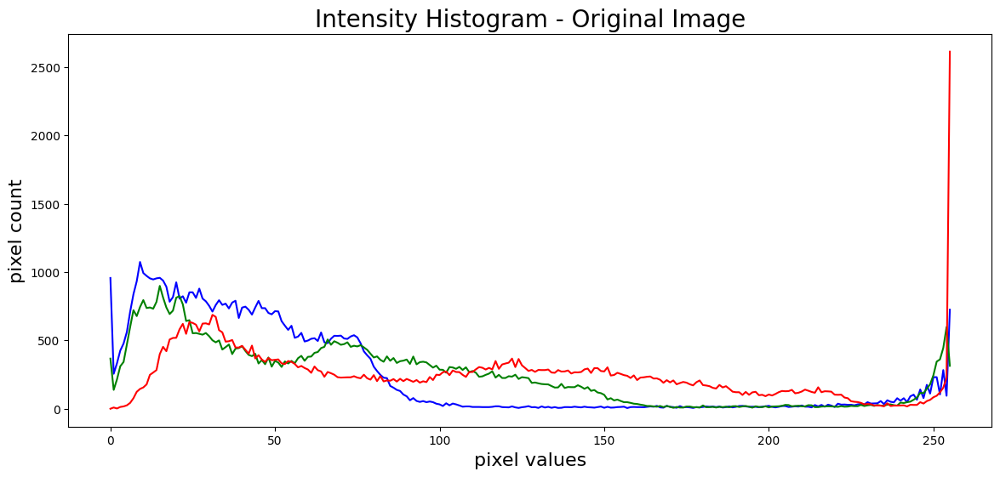

In [50]:
image = "HorizonZero"
ext = ".png"
img = cv2.imread(image + ext,1)
pil_im = Image.open(image + ext, 'r')
imshow(np.asarray(pil_im))
plt.figure(figsize=(14,6))

histogram_blue = cv2.calcHist([img],[0],None,[256],[0,256])
plt.plot(histogram_blue, color='blue')
histogram_green = cv2.calcHist([img],[1],None,[256],[0,256])
plt.plot(histogram_green, color='green')
histogram_red = cv2.calcHist([img],[2],None,[256],[0,256])
plt.plot(histogram_red, color='red')
plt.title('Intensity Histogram - Original Image', fontsize=20)
plt.xlabel('pixel values', fontsize=16)
plt.ylabel('pixel count', fontsize=16)
plt.show()

### Encrypted Image

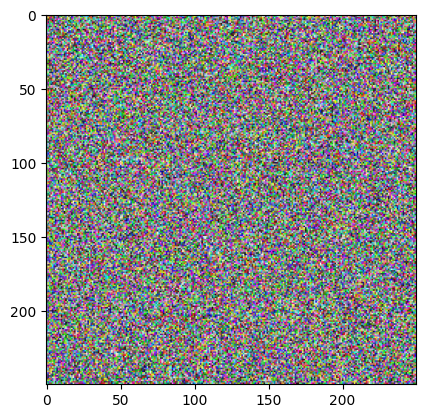

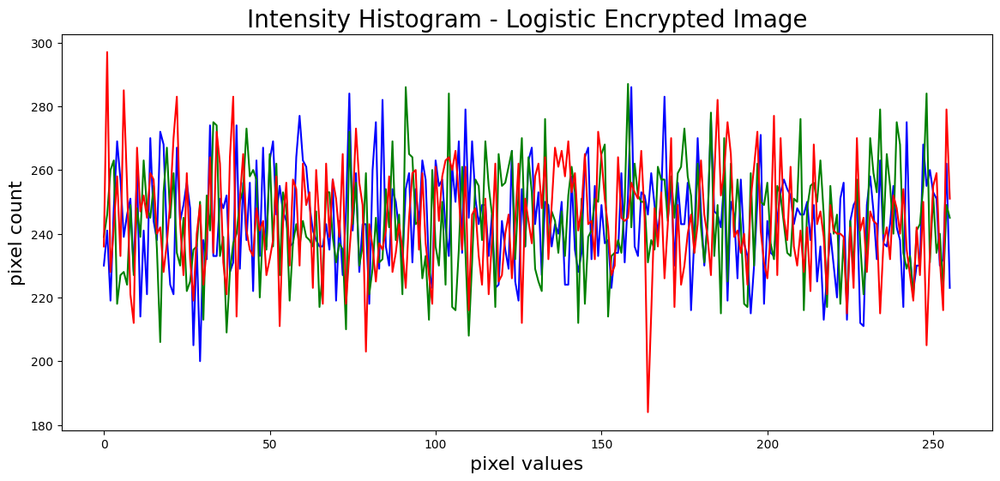

In [51]:
image = "HorizonZero_LogisticEnc"
ext = ".png"
img = cv2.imread(image + ext,1)
pil_im = Image.open(image + ext, 'r')
imshow(np.asarray(pil_im))
plt.figure(figsize=(14,6))

histogram_blue = cv2.calcHist([img],[0],None,[256],[0,256])
plt.plot(histogram_blue, color='blue')
histogram_green = cv2.calcHist([img],[1],None,[256],[0,256])
plt.plot(histogram_green, color='green')
histogram_red = cv2.calcHist([img],[2],None,[256],[0,256])
plt.plot(histogram_red, color='red')
plt.title('Intensity Histogram - Logistic Encrypted Image', fontsize=20)
plt.xlabel('pixel values', fontsize=16)
plt.ylabel('pixel count', fontsize=16)
plt.show()

## Adjacent Pixel Auto-Correlation

### Original Image

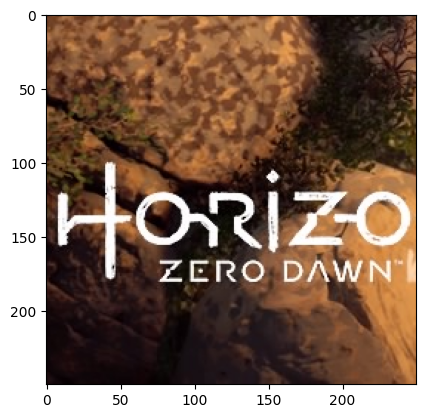

In [52]:
image = "HorizonZero"
ext = ".png"
img = Image.open(image+ext).convert('LA')
pil_im = Image.open(image + ext, 'r')
imshow(np.asarray(pil_im))

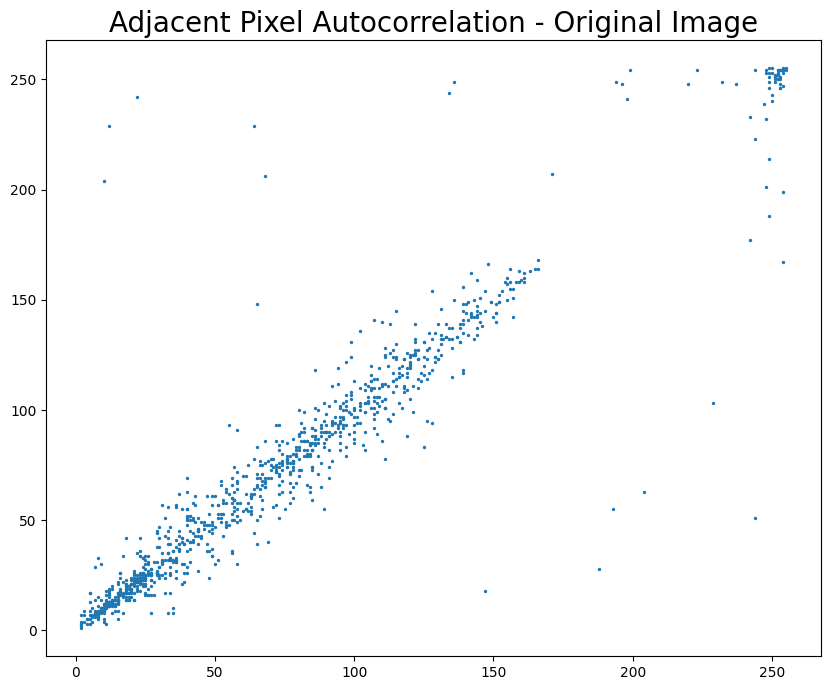

In [53]:
image = "HorizonZero"
ext = ".png"
ImageMatrix, image_width, image_height, color = getImageMatrix_gray(image + ext)
samples_x = []
samples_y = []
for i in range(1024):
    x = random.randint(0, image_width - 2)
    y = random.randint(0, image_height - 1)
    samples_x.append(ImageMatrix[y][x])  # Swapped x and y indices
    samples_y.append(ImageMatrix[y][x + 1])  # Swapped x and y indices
plt.figure(figsize=(10, 8))
plt.scatter(samples_x, samples_y, s=2)
plt.title('Adjacent Pixel Autocorrelation - Original Image', fontsize=20)
plt.show()

### Encrypted Image

250 250


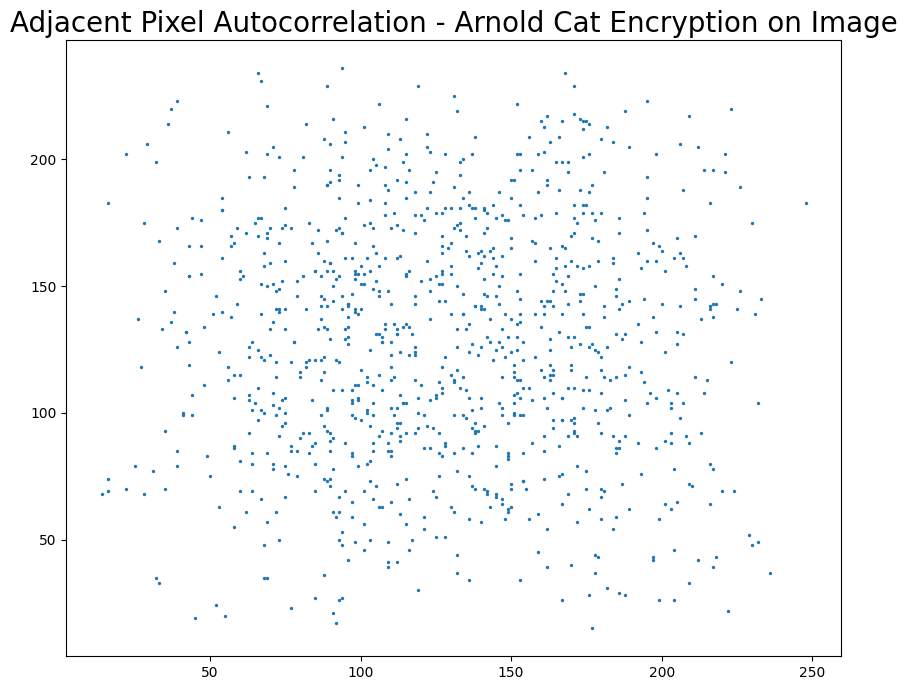

In [54]:
image = "HorizonZero_LogisticEnc"
ext = ".png"
ImageMatrix, image_width, image_height, color = getImageMatrix_gray(image + ext)
samples_x = []
samples_y = []
print(image_width, image_height)  # Print image width and height
for i in range(1024):
    x = random.randint(0, image_width - 2)
    y = random.randint(0, image_height - 1)
    samples_x.append(ImageMatrix[x][y])
    samples_y.append(ImageMatrix[x + 1][y])
plt.figure(figsize=(10, 8))
plt.scatter(samples_x, samples_y, s=2)
plt.title('Adjacent Pixel Autocorrelation - Arnold Cat Encryption on Image', fontsize=20)
plt.show()


## Entropy Analysis

In [55]:
image = "HorizonZero_LogisticEnc"
ext = ".png"
image_path = image + ext

# Calculate the entropy of the image
entropy_le = calculate_entropy(image_path)
print("Entropy of the image:", entropy_le)

Entropy of the image: 7.627169672741719


# Key Sensitivity

### Original Image

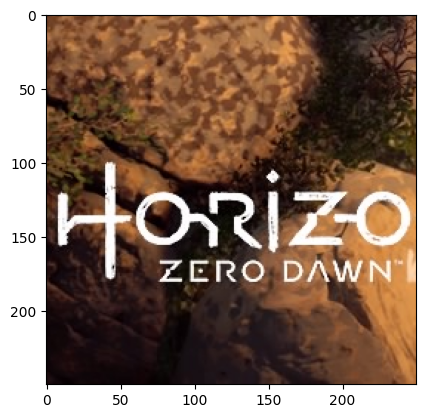

In [56]:
image = "HorizonZero"
ext = ".png"
img = cv2.imread(image + ext,1)
pil_im = Image.open(image + ext, 'r')
imshow(np.asarray(pil_im))

## Arnold Cat

Encrypt with key = 20

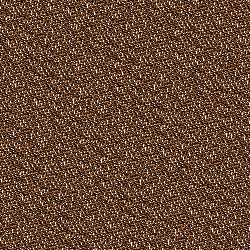

In [57]:
ArnoldCatEncryptionIm = ArnoldCatEncryption(image + ext, 20)
cv2_imshow(ArnoldCatEncryptionIm)

Decrypt with key = 20

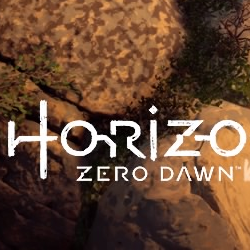

In [58]:
ArnoldCatDecryptionIm = ArnoldCatDecryption(image + "_ArnoldcatEnc.png", 20)
cv2_imshow(ArnoldCatDecryptionIm)

Decrypt with Incorrect Key = 29

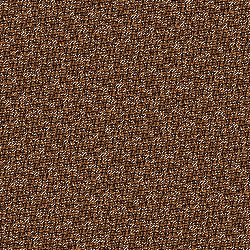

In [59]:
ArnoldCatDecryptionIm = ArnoldCatDecryption(image + "_ArnoldcatEnc.png", 29)
cv2_imshow(ArnoldCatDecryptionIm)

## Henon Maps

Encrypt with key (0.1, 0.1)

Encryption completed successfully!


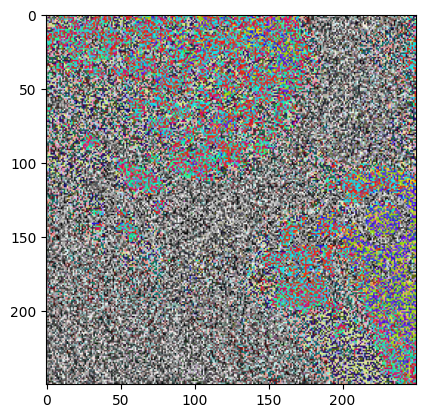

In [60]:
HenonEncryption(image + ext, (0.1, 0.1), dimension)
im = Image.open(image + "_HenonEnc.png", 'r')
imshow(np.asarray(im))

Decrypt with the key (0.1, 0.1)

Decryption completed successfully!


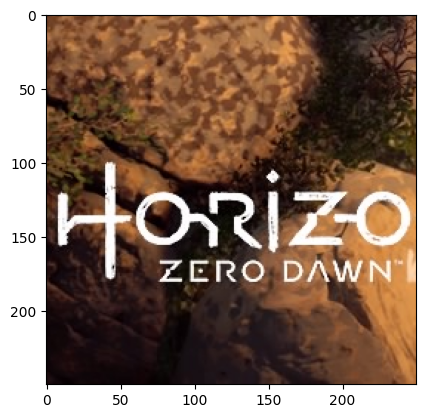

In [61]:
HenonDecryption(image + "_HenonEnc.png", (0.1, 0.1), dimension)
im = Image.open(image + "_HenonDec.png", 'r')
imshow(np.asarray(im))

Decrypt with the Incorrect key (0.1, 0.150)

Decryption completed successfully!


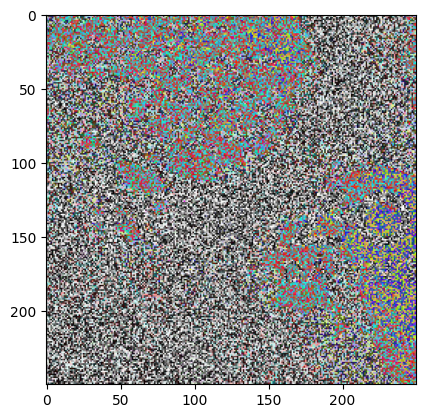

In [62]:
HenonDecryption(image + "_HenonEnc.png", (0.1, 0.150), dimension)
im = Image.open(image + "_HenonDec.png", 'r')
imshow(np.asarray(im))

## Logistic Maps

Decrypt with the key "supersecretke"

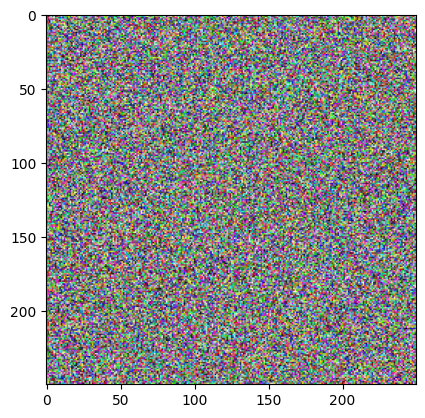

In [63]:
LogisticEncryption(image + ext, key = "supersecretke")
im = Image.open(image + "_LogisticEnc.png", 'r')
imshow(np.asarray(im))

Decrypt with the key "supersecretke"


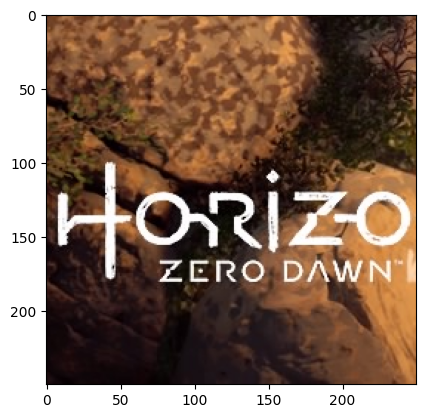

In [64]:
LogisticDecryption(image + "_LogisticEnc.png", "supersecretke")
im = Image.open(image + "_LogisticDec.png", 'r')
imshow(np.asarray(im))

Decrypt with the Incorrect key "supersecretdd"


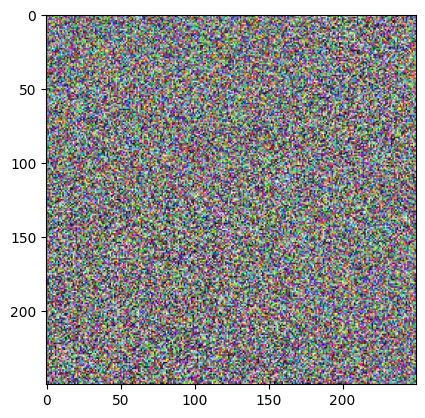

In [65]:
LogisticDecryption(image + "_LogisticEnc.png", "supersecretdd")
im = Image.open(image + "_LogisticDec.png", 'r')
imshow(np.asarray(im))

## Key Sensitivity

### Arnold Cat Map

In [66]:
import numpy as np
import cv2
from PIL import Image

def calculate_npcr_uaci(img1, img2):
    # Check if images have the same dimensions
    if img1.shape != img2.shape:
        raise ValueError("Images must have the same dimensions.")

    # Convert images to grayscale
    if len(img1.shape) == 3:
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    if len(img2.shape) == 3:
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    # Calculate NPCR
    npc_rate = np.sum(img1 != img2) / (img1.shape[0] * img1.shape[1]) * 100

    # Calculate UACI
    uaci = np.sum(np.abs(img1.astype(int) - img2.astype(int))) / (img1.shape[0] * img1.shape[1])

    return npc_rate, uaci

# Load images
image1 = "HorizonZero"
ext = ".png"
img1 = cv2.imread(image1 + ext, 1)
pil_im1 = Image.open(image1 + ext).convert('RGB')

image2 = "HorizonZero_ArnoldcatEnc"
ext = ".png"
img2 = cv2.imread(image2 + ext, 1)
pil_im2 = Image.open(image2 + ext).convert('RGB')

# Calculate NPCR and UACI
ac_npc_rate, ac_uaci = calculate_npcr_uaci(img1, img2)

# Print results
print("Number of Pixel Change Rate (NPCR): {:.2f}%".format(ac_npc_rate))
print("Uniform Average Change Intensity (UACI): {:.2f}".format(ac_uaci))


Number of Pixel Change Rate (NPCR): 99.12%
Uniform Average Change Intensity (UACI): 66.56


### Henon Map

In [67]:
def calculate_npcr_uaci(img1, img2):
    # Check if images have the same dimensions
    if img1.shape != img2.shape:
        raise ValueError("Images must have the same dimensions.")

    # Convert images to grayscale
    if len(img1.shape) == 3:
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    if len(img2.shape) == 3:
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    # Calculate NPCR
    npc_rate = np.sum(img1 != img2) / (img1.shape[0] * img1.shape[1]) * 100

    # Calculate UACI
    uaci = np.sum(np.abs(img1.astype(int) - img2.astype(int))) / (img1.shape[0] * img1.shape[1])

    return npc_rate, uaci

# Load images
image1 = "HorizonZero"
ext = ".png"
img1 = cv2.imread(image1 + ext, 1)
pil_im1 = Image.open(image1 + ext).convert('RGB')

image2 = "HorizonZero_HenonEnc"
ext = ".png"
img2 = cv2.imread(image2 + ext, 1)
pil_im2 = Image.open(image2 + ext).convert('RGB')

# Calculate NPCR and UACI
hm_npc_rate, hm_uaci = calculate_npcr_uaci(img1, img2)

# Print results
print("Number of Pixel Change Rate (NPCR): {:.2f}%".format(hm_npc_rate))
print("Uniform Average Change Intensity (UACI): {:.2f}".format(hm_uaci))


Number of Pixel Change Rate (NPCR): 99.56%
Uniform Average Change Intensity (UACI): 78.83


### Logistic Map

In [68]:
def calculate_npcr_uaci(img1, img2):
    # Check if images have the same dimensions
    if img1.shape != img2.shape:
        raise ValueError("Images must have the same dimensions.")

    # Convert images to grayscale
    if len(img1.shape) == 3:
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    if len(img2.shape) == 3:
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    # Calculate NPCR
    npc_rate = np.sum(img1 != img2) / (img1.shape[0] * img1.shape[1]) * 100

    # Calculate UACI
    uaci = np.sum(np.abs(img1.astype(int) - img2.astype(int))) / (img1.shape[0] * img1.shape[1])

    return npc_rate, uaci

# Load images
image1 = "HorizonZero"
ext = ".png"
img1 = cv2.imread(image1 + ext, 1)
pil_im1 = Image.open(image1 + ext).convert('RGB')

image2 = "HorizonZero_LogisticEnc"
ext = ".png"
img2 = cv2.imread(image2 + ext, 1)
pil_im2 = Image.open(image2 + ext).convert('RGB')

# Calculate NPCR and UACI
lm_npc_rate, lm_uaci = calculate_npcr_uaci(img1, img2)

# Print results
print("Number of Pixel Change Rate (NPCR): {:.2f}%".format(lm_npc_rate))
print("Uniform Average Change Intensity (UACI): {:.2f}".format(lm_uaci))


Number of Pixel Change Rate (NPCR): 99.63%
Uniform Average Change Intensity (UACI): 76.90


## Predicting Best Encryption for a Given Image


In [69]:
def choose_map(entropy_ac, entropy_hc, entropy_le, ac_npc_rate, hm_npc_rate, lm_npc_rate):
    max_entropy = max(entropy_ac, entropy_hc, entropy_le)
    max_npc_rate = max(ac_npc_rate, hm_npc_rate, lm_npc_rate)

    if entropy_ac == entropy_hc == entropy_le == max_entropy:
        print("All maps are suitable based on entropy")
    elif max_entropy == entropy_ac:
        print("Arnold Cat Map is suitable based on entropy")
    elif max_entropy == entropy_hc:
        print("Henon Map is suitable based on entropy")
    elif max_entropy == entropy_le:
        print("Logistic Encryption Map is suitable based on entropy")

    if ac_npc_rate == hm_npc_rate == lm_npc_rate == max_npc_rate:
        print("All maps are suitable based on NPCR rate")
    elif max_npc_rate == ac_npc_rate:
        print("Arnold Cat Map is suitable based on NPCR rate")
    elif max_npc_rate == hm_npc_rate:
        print("Henon Map is suitable based on NPCR rate")
    elif max_npc_rate == lm_npc_rate:
        print("Logistic Encryption Map is suitable based on NPCR rate")

choose_map(entropy_ac, entropy_hc, entropy_le, ac_npc_rate, hm_npc_rate, lm_npc_rate)

Logistic Encryption Map is suitable based on entropy
Logistic Encryption Map is suitable based on NPCR rate
